# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset

import sys
import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

%matplotlib inline

In [2]:
# Get data set from processed tfrecord files
dataset = get_dataset('/data/waymo/processed/*.tfrecord')

INFO:tensorflow:Reading unweighted datasets: ['/data/waymo/processed/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['/data/waymo/processed/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 100
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    # According to Waymo data photo format: 1 -> vehicle, 2 -> pedestrian, 3 -> sign, 4 -> cyclist
    color_map = {1: 'red', 2: 'blue', 4: 'green'}
    # Init plot
    fig, ax = plt.subplots(figsize=(20, 20))
    ax.axis('off')
    
    # Add image
    image = batch['image'].numpy()
    ax.imshow(image)
    
    # Add bounding boxes
    height, width = image.shape[:2]
    boxes = batch['groundtruth_boxes'].numpy()
    classes = batch['groundtruth_classes'].numpy()
    for bb, cl in zip(boxes, classes):
        y1, x1, y2, x2 = bb
        x1 *= width
        x2 *= width
        y1 *= height
        y2 *= height
        
        bb_width = x2 - x1
        bb_height = y2 - y1
        box = Rectangle((x1, y1), x2 - x1, y2 - y1, facecolor='none', edgecolor=color_map[cl], linewidth=2)
        ax.add_patch(box)
    
    # Show plot
    plt.show()

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

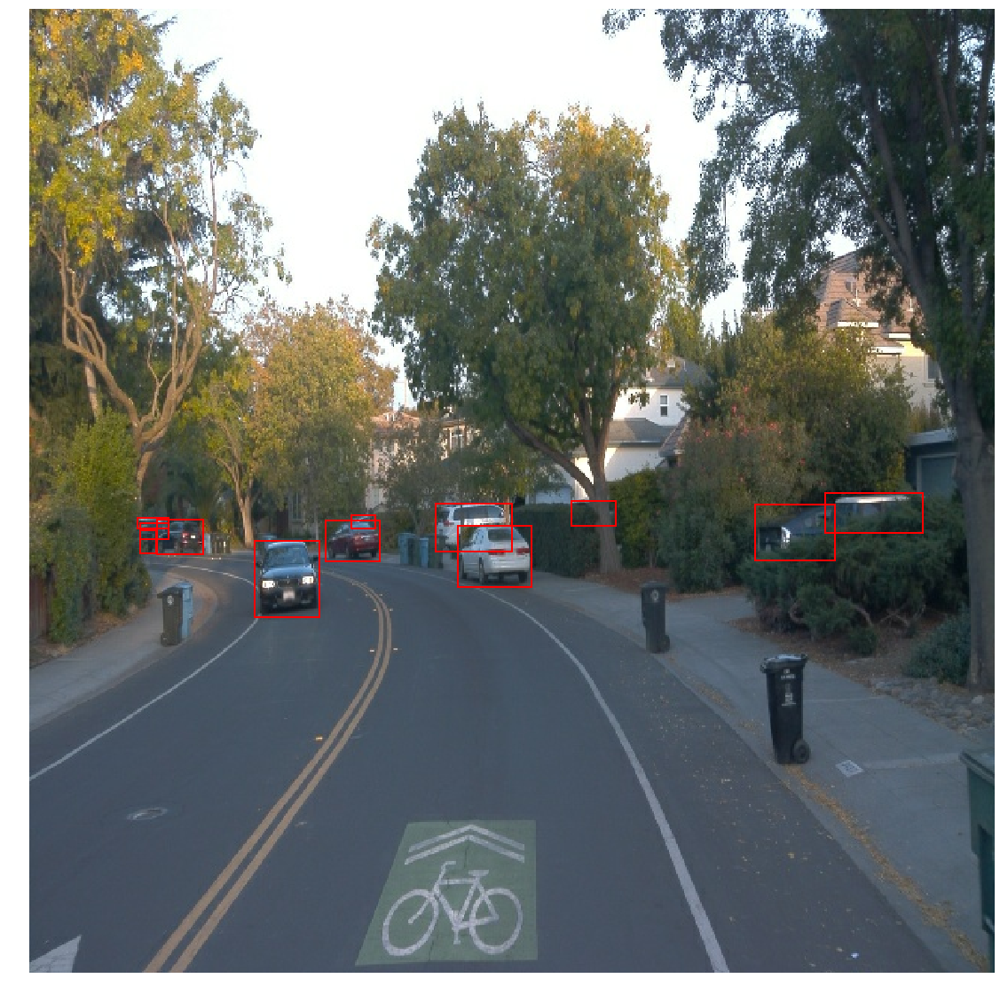

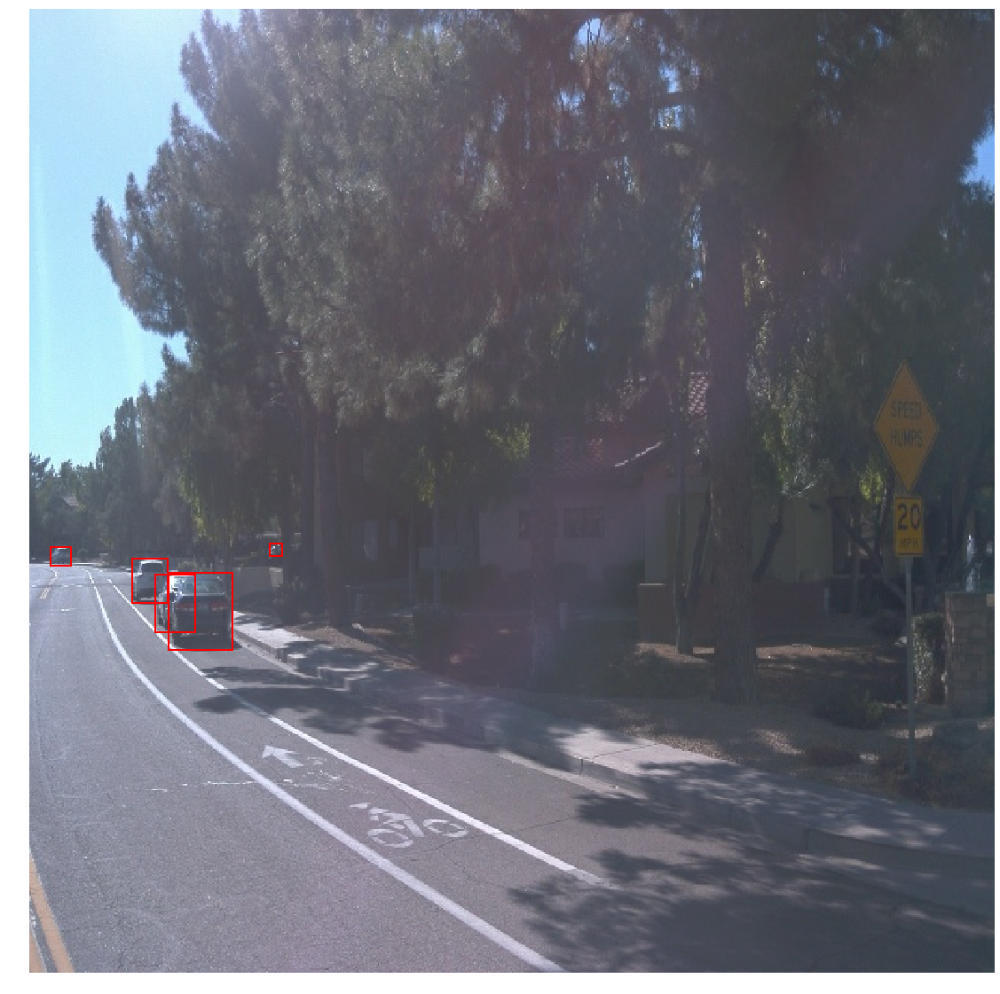

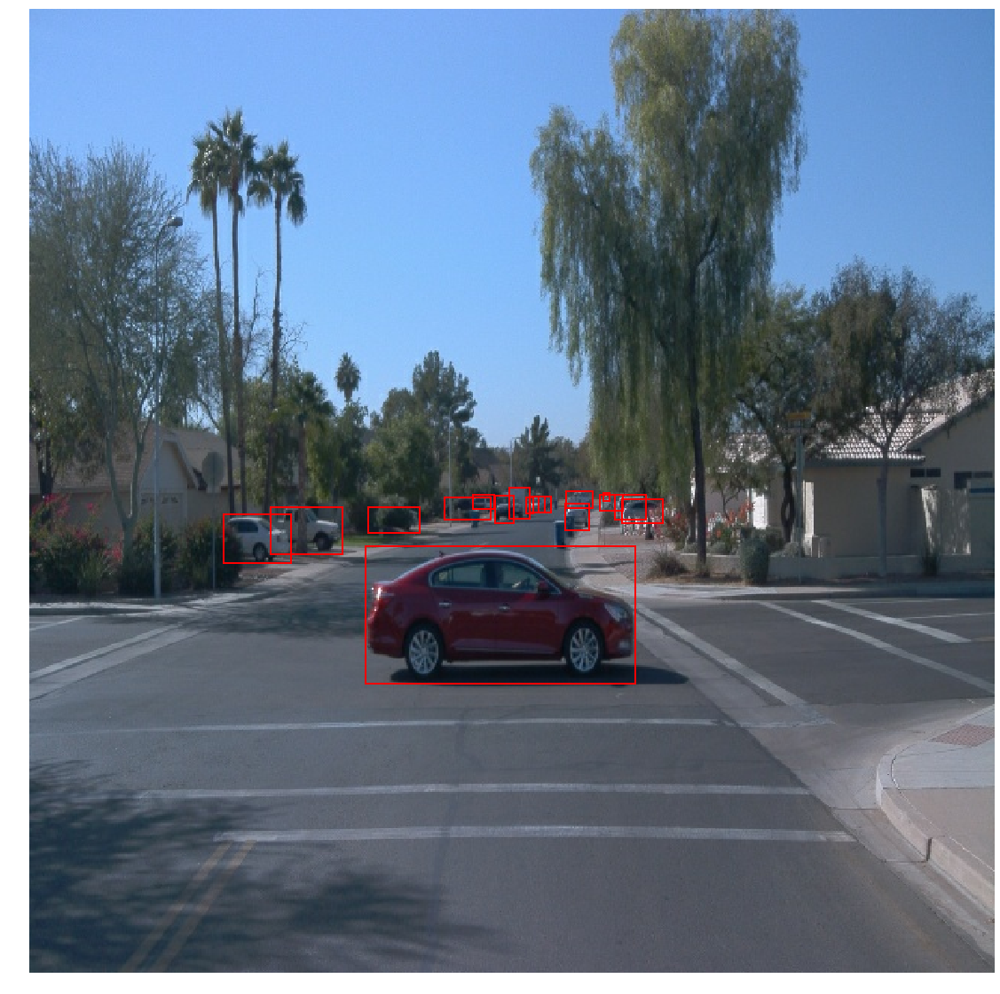

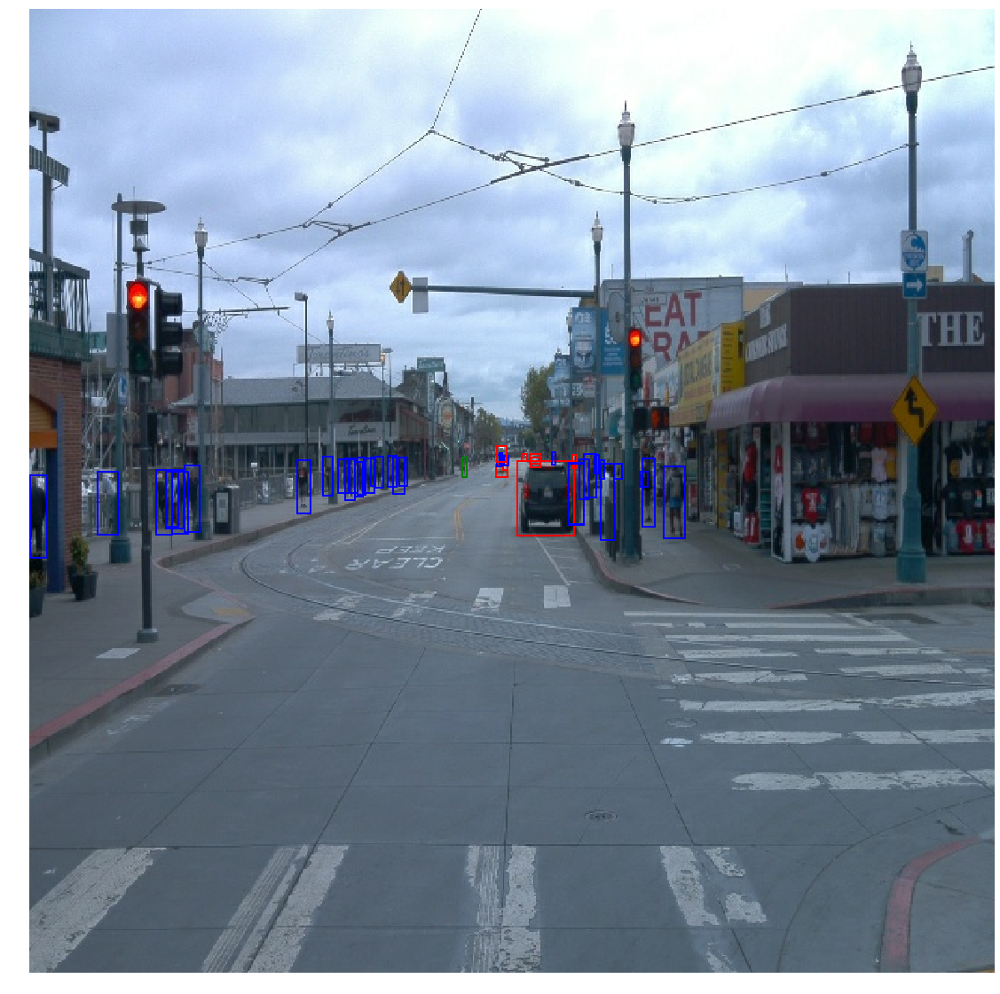

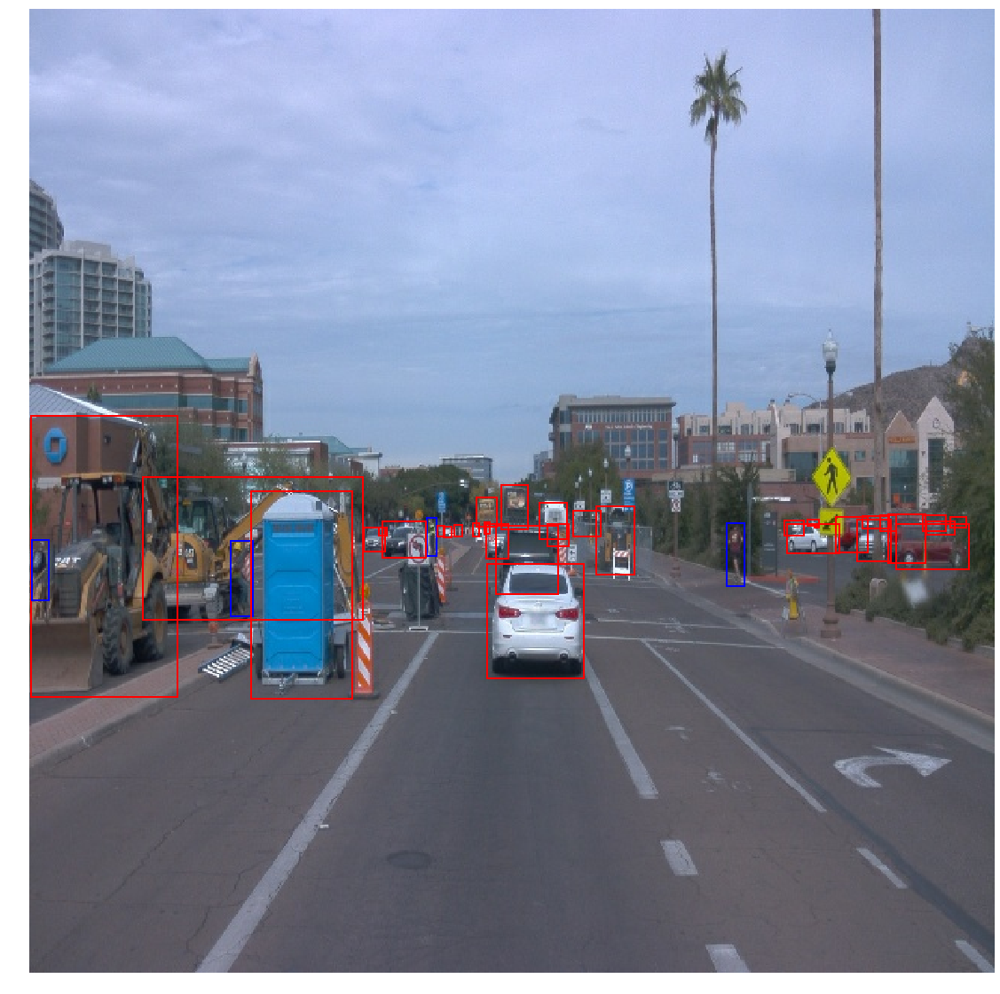

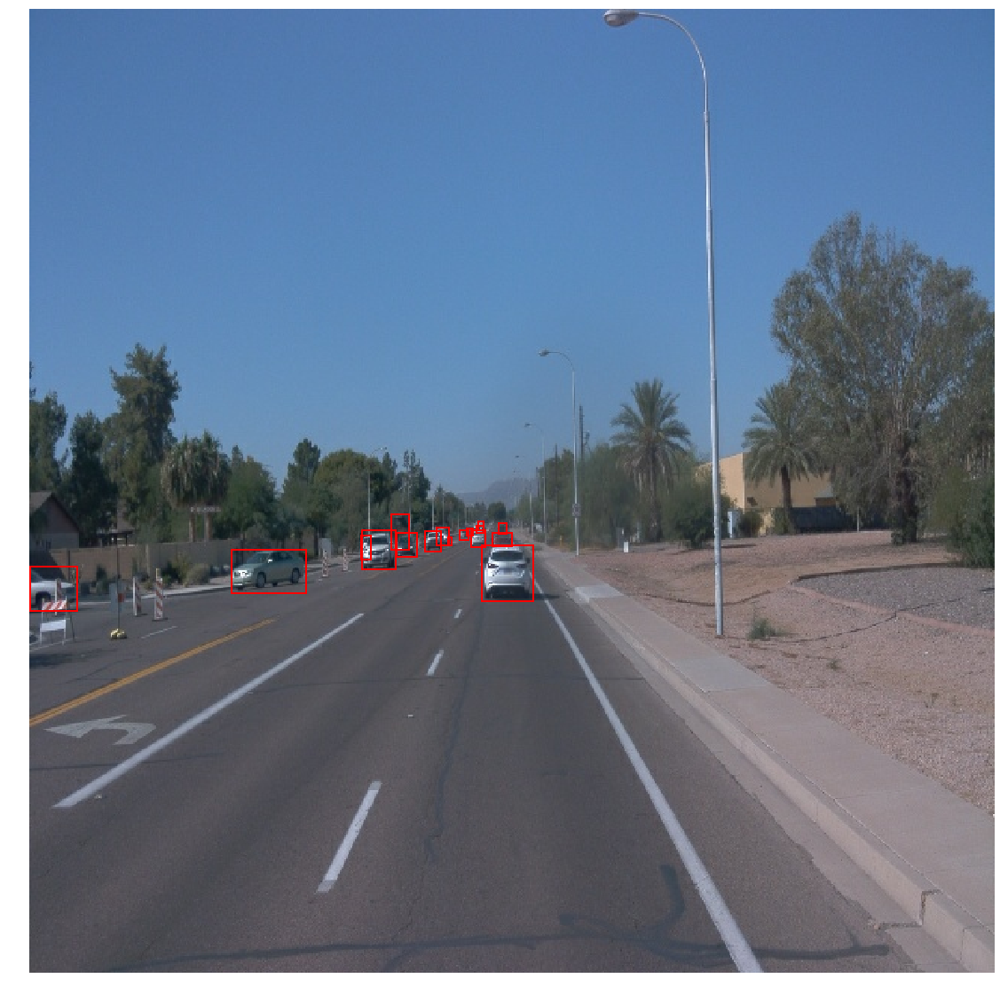

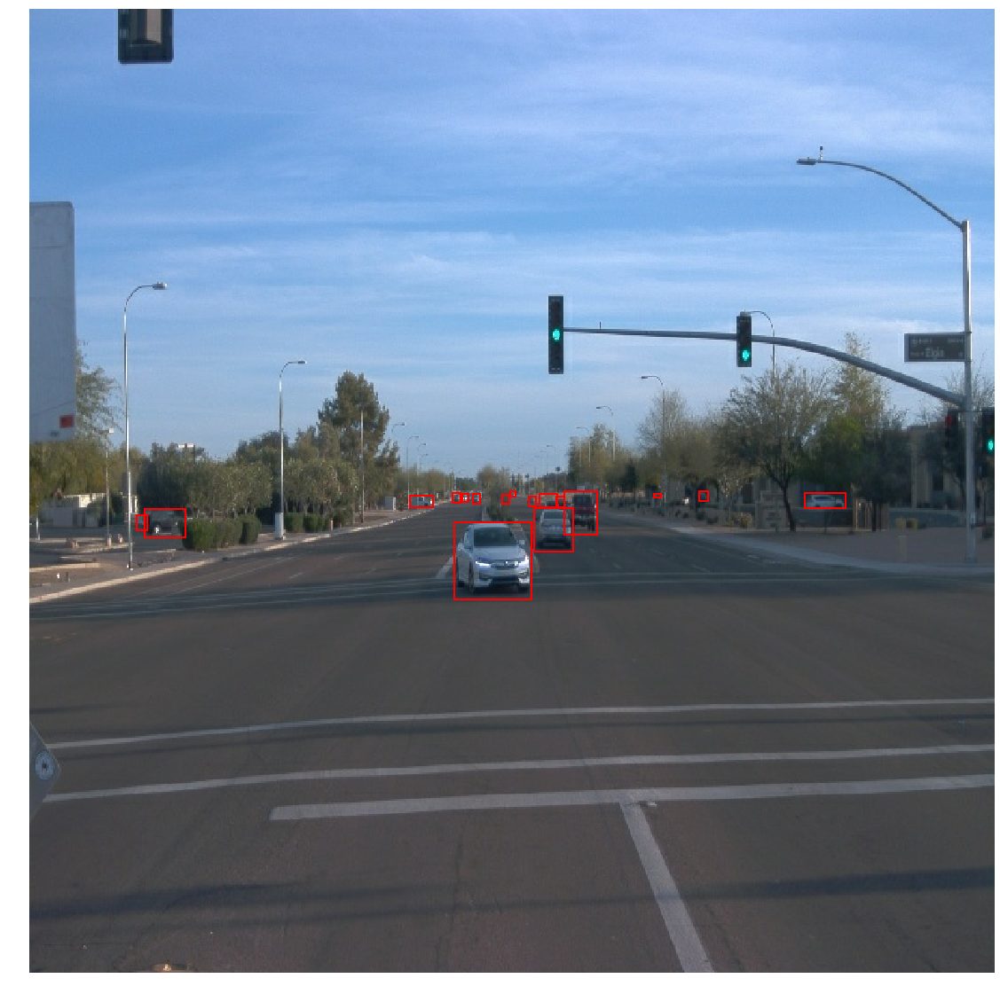

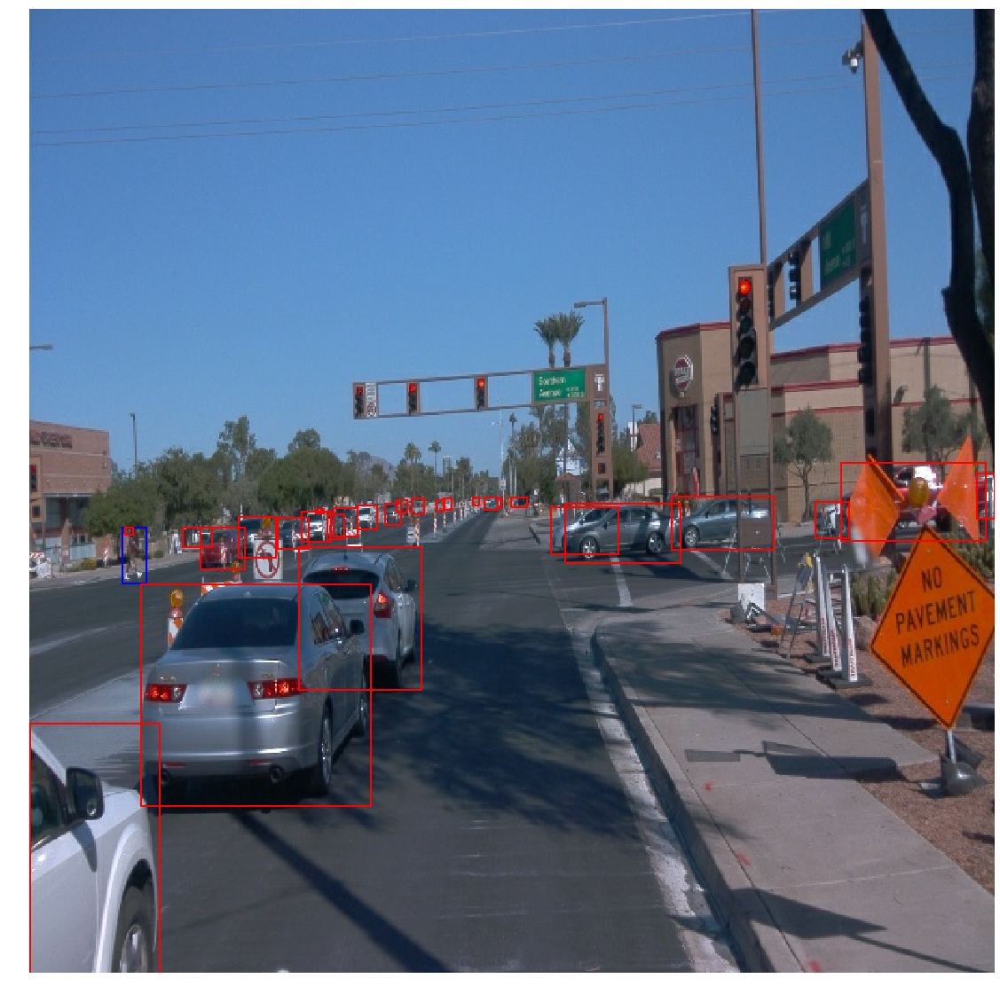

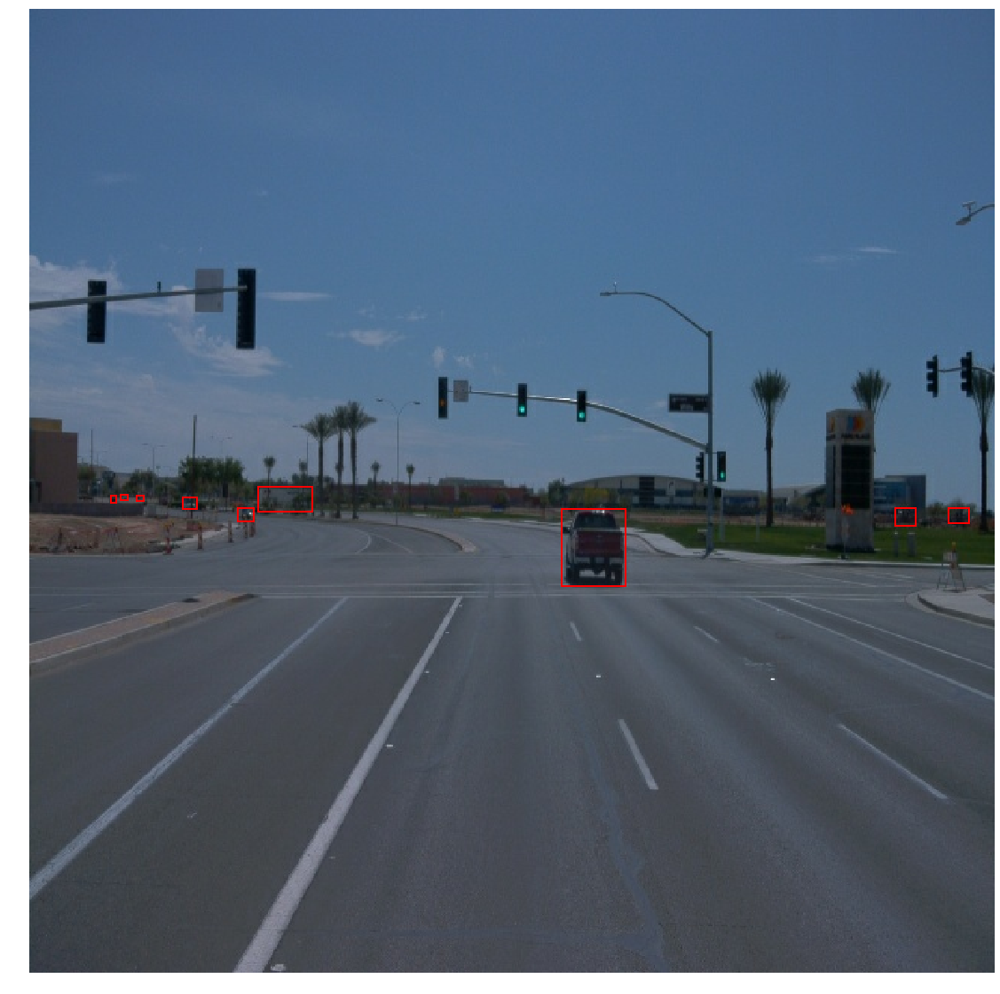

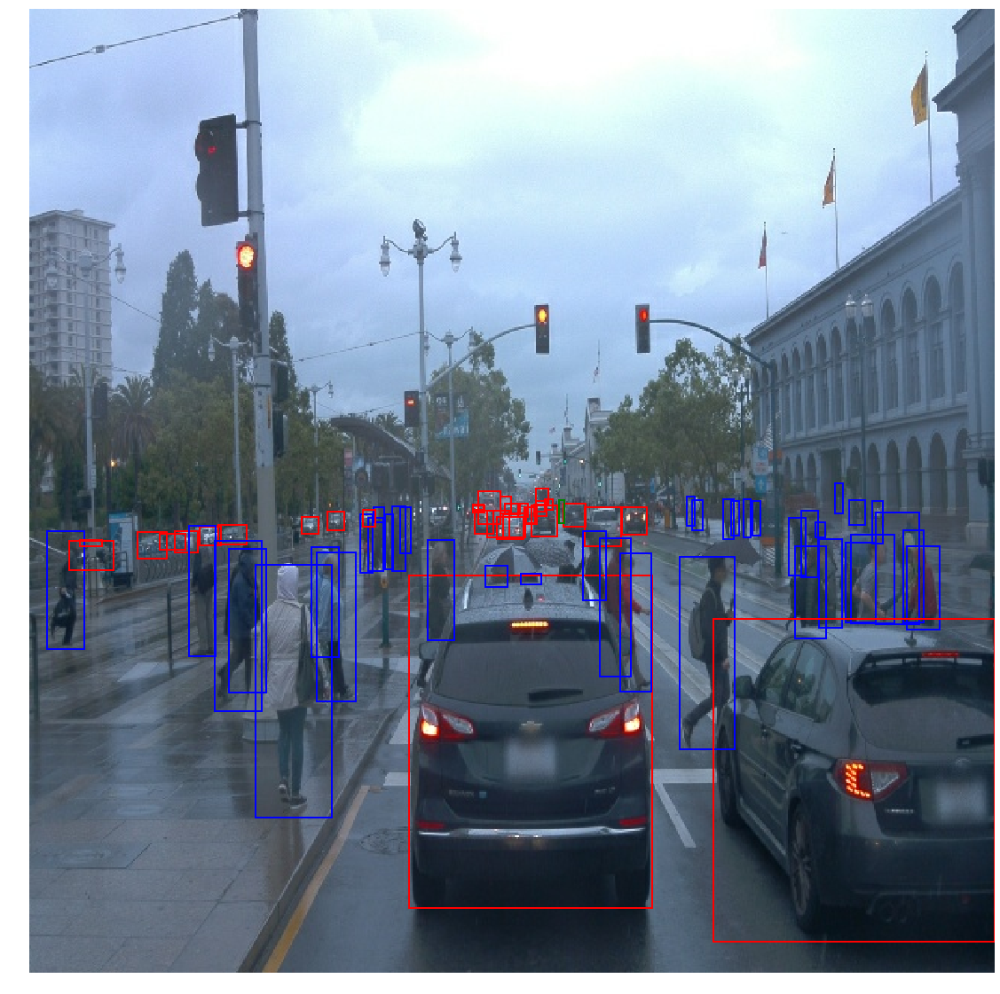

In [4]:
# Display 10 random images with bounding boxes
for batch in dataset.shuffle(1000, reshuffle_each_iteration=True).take(10):
    display_instances(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

### Collect addtional information

In [5]:
# Use TFRecordDataset to get the dataset from processed files.
# Should not use provided get_dataset function in this case.
def decode_fn(record_bytes):
    return tf.io.parse_single_example(
      # Data
      record_bytes,

      # Schema
      {"image/height": tf.io.FixedLenFeature([], tf.int64, default_value=0),
       "image/width": tf.io.FixedLenFeature([], tf.int64, default_value=0),
       "image/filename": tf.io.FixedLenFeature([], tf.string, default_value=""),
       "image/source_id": tf.io.FixedLenFeature([], tf.string, default_value=""),
       "image/encoded": tf.io.FixedLenFeature([], tf.string, default_value=""),
       "image/format": tf.io.FixedLenFeature([], tf.string, default_value=""),
       "image/object/bbox/xmin": tf.io.VarLenFeature(tf.float32),
       "image/object/bbox/xmax": tf.io.VarLenFeature(tf.float32),
       "image/object/bbox/ymin": tf.io.VarLenFeature(tf.float32),
       "image/object/bbox/ymax": tf.io.VarLenFeature(tf.float32),
       "image/object/class/text": tf.io.VarLenFeature(tf.string),
       "image/object/class/label": tf.io.VarLenFeature(tf.int64)}
    )

processed_dataset = tf.data.TFRecordDataset(glob.glob('/data/waymo/processed/*.tfrecord')).map(decode_fn)

# Initialize variables
class_count = {1: 0, 2 : 0, 4: 0}
class_dist = {1:[], 2:[], 4:[], 'total':[]}
min_all = sys.maxsize
min_all_batch = None
max_all = -1
max_all_batch = None
min_vehicle = sys.maxsize
min_vehicle_batch = None
max_vehicle = -1
max_vehicle_batch = None
min_pedestrian = sys.maxsize
min_pedestrian_batch = None
max_pedestrian = -1
max_pedestrian_batch = None
min_cyclist = sys.maxsize
min_cyclist_batch = None
max_cyclist = -1
max_cyclist_batch = None

# Iterate whole dataset
for batch in processed_dataset.take(-1):
    count = {1: 0, 2 : 0, 4: 0 }
    total = 0
    # Get number of each class in each image
    for cl in tf.sparse.to_dense(batch["image/object/class/label"]).numpy():
        total += 1
        class_count[cl] += 1
        count[cl] += 1
    class_dist[1].append(count[1])
    class_dist[2].append(count[2])
    class_dist[4].append(count[4])
    class_dist['total'].append(total)
    
    # Get min, max values and corresponding batches
    if total < min_all:
        min_all = total
        min_all_batch = batch
    if total > max_all:
        max_all = total
        max_all_batch = batch
    if count[1] < min_vehicle:
        min_vehicle = count[1]
        min_vehicle_batch = batch
    if count[1] > max_vehicle:
        max_vehicle = count[1]
        max_vehicle_batch = batch
    if count[2] < min_pedestrian:
        min_pedestrian = count[2]
        min_pedestrian_batch = batch
    if count[2] > max_pedestrian:
        max_pedestrian = count[2]
        max_pedestrian_batch = batch
    if count[4] < min_cyclist:
        min_cyclist = count[4]
        min_cyclist_batch = batch
    if count[4] > max_cyclist:
        max_cyclist = count[4]
        max_cyclist_batch = batch

### Number of batches in the dataset
This information let us know how much data we have and how to split the data set.

In [6]:
print(f'We have {len(class_dist[1])} images in the dataset.')

We have 19803 images in the dataset.


### Classes distribution in the dataset

<BarContainer object of 3 artists>

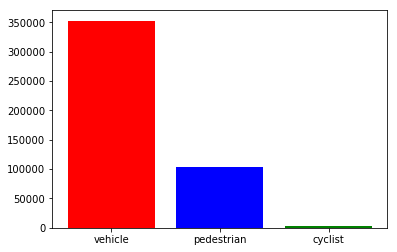

In [7]:
class_names = {1: 'vehicle', 2: 'pedestrian', 4: 'cyclist'}
colors = ['red', 'blue', 'green']
total_object = sum(class_count.values())
plt.bar([class_names[cl] for cl in class_count.keys()], class_count.values(), color=['red', 'blue', 'green'])

In [8]:
print(f'We have {total_object} objects in the dataset. They include:')
print(f'- {class_count[1]} vehicles ({class_count[1] * 100 / total_object:.2f}%)')
print(f'- {class_count[2]} pedestrians ({class_count[2] * 100 / total_object:.2f}%)')
print(f'- {class_count[4]} cyclists ({class_count[4] * 100 / total_object:.2f}%)')

We have 458997 objects in the dataset. They include:
- 352694 vehicles (76.84%)
- 103664 pedestrians (22.58%)
- 2639 cyclists (0.57%)


- The classes are highly imbalanced. There are a lot of vehicles and very few cyclists.
- The model may struggle when detecting cyclists.

### Classes distribution in each batch

**Number of vehicles in each image**

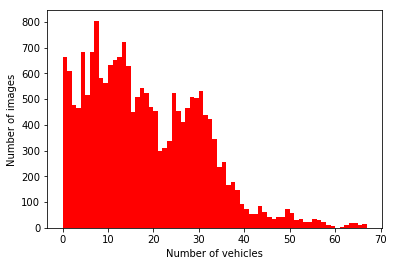

Minimum number of vehicles in an image: 0
Maximum number of vehicles in an image: 67


In [9]:
imn, bins, patches = plt.hist(class_dist[1], max_vehicle, facecolor='red')
plt.xlabel('Number of vehicles')
plt.ylabel('Number of images')
plt.show()
print(f'Minimum number of vehicles in an image: {min_vehicle}')
print(f'Maximum number of vehicles in an image: {max_vehicle}')

**Number of pedestrians in each image**

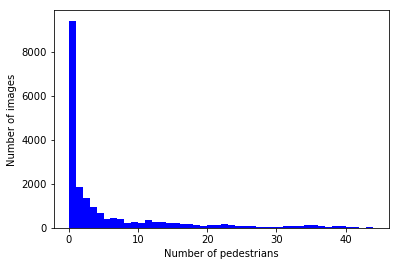

Minimum number of pedestrians in an image: 0
Maximum number of pedestrians in an image: 44


In [10]:
imn, bins, patches = plt.hist(class_dist[2], max_pedestrian, facecolor='blue')
plt.xlabel('Number of pedestrians')
plt.ylabel('Number of images')
plt.show()
print(f'Minimum number of pedestrians in an image: {min_pedestrian}')
print(f'Maximum number of pedestrians in an image: {max_pedestrian}')

**Number of cyclists in each image**

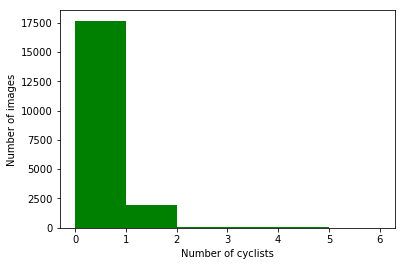

Minimum number of cyclists in an image: 0
Maximum number of cyclisst in an image: 6


In [11]:
imn, bins, patches = plt.hist(class_dist[4], max_cyclist, facecolor='green')
plt.xlabel('Number of cyclists')
plt.ylabel('Number of images')
plt.show()
print(f'Minimum number of cyclists in an image: {min_cyclist}')
print(f'Maximum number of cyclisst in an image: {max_cyclist}')

**Number of labeled objects (vehicles, pedestrians and cyclists) in each image**

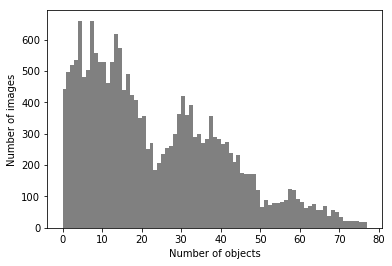

Minimum number of all objects in an image: 0
Maximum number of all objects in an image: 77


In [12]:
imn, bins, patches = plt.hist(class_dist['total'], max_all, facecolor='grey')
plt.xlabel('Number of objects')
plt.ylabel('Number of images')
plt.show()
print(f'Minimum number of all objects in an image: {min_all}')
print(f'Maximum number of all objects in an image: {max_all}')

### Display images that have minimum/maximum number of objects in each batch
When iterate the dataset only **first image** with minimum/maximum number of objects will be kept for later display.

In [13]:
def display_image(batch, title):
    """
    This function takes a batch and display the image with the associated bounding boxes.
    """
    color_map = {1: 'red', 2: 'blue', 4: 'green'}
    # Init plot
    fig, ax = plt.subplots(figsize=(20, 20))
    ax.axis('off')
    ax.set_title(title)
    
    # Add image
    image = tf.io.decode_jpeg(batch["image/encoded"])
    ax.imshow(image)
    
    # Add bounding boxes
    height, width = image.shape[:2]
    boxes_x1 = tf.sparse.to_dense(batch["image/object/bbox/xmin"]).numpy()
    boxes_x2 = tf.sparse.to_dense(batch["image/object/bbox/xmax"]).numpy()
    boxes_y1 = tf.sparse.to_dense(batch["image/object/bbox/ymin"]).numpy()
    boxes_y2 = tf.sparse.to_dense(batch["image/object/bbox/ymax"]).numpy()
    classes = tf.sparse.to_dense(batch["image/object/class/label"]).numpy()
    for x1, x2, y1, y2, cl in zip(boxes_x1, boxes_x2, boxes_y1, boxes_y2, classes):
        x1 *= width
        x2 *= width
        y1 *= height
        y2 *= height
        
        bb_width = x2 - x1
        bb_height = y2 - y1
        box = Rectangle((x1, y1), x2 - x1, y2 - y1, facecolor='none', edgecolor=color_map[cl], linewidth=2)
        ax.add_patch(box)
    
    # Show plot
    plt.show()

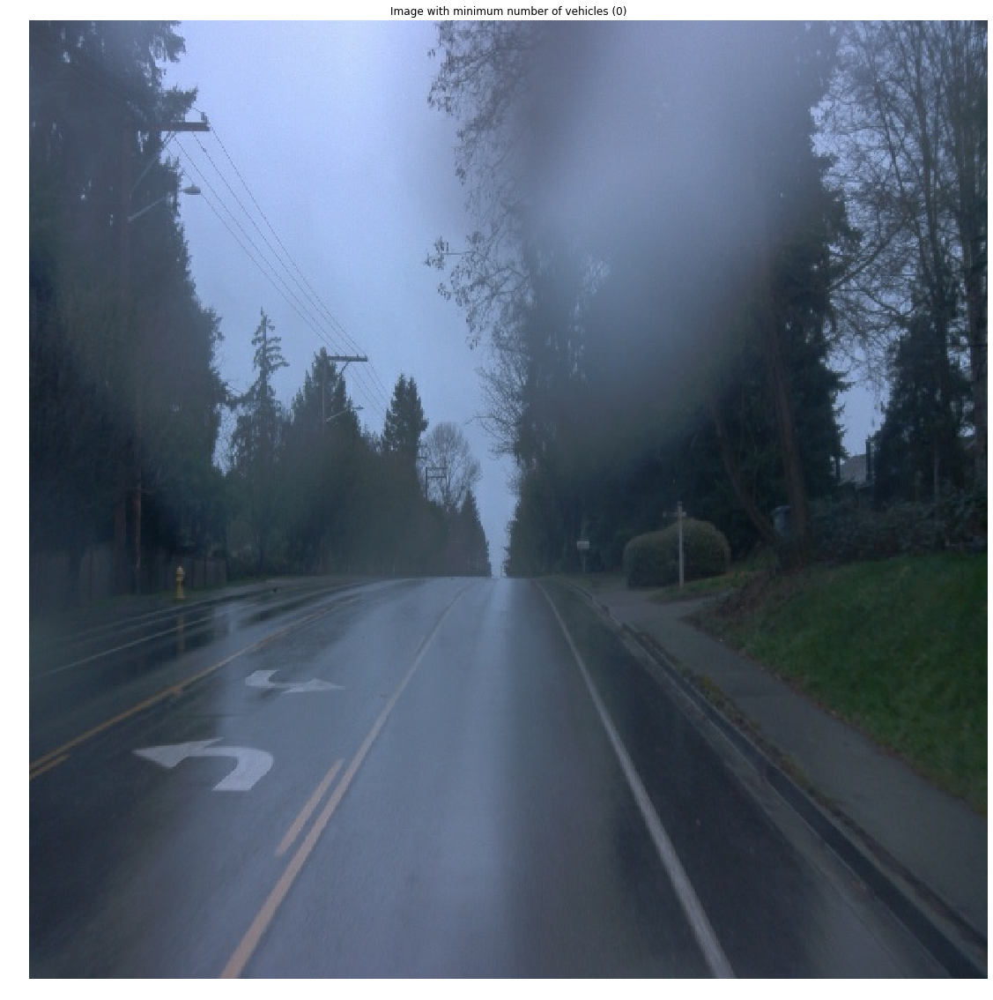

In [14]:
display_image(min_vehicle_batch, f'Image with minimum number of vehicles ({min_vehicle})')

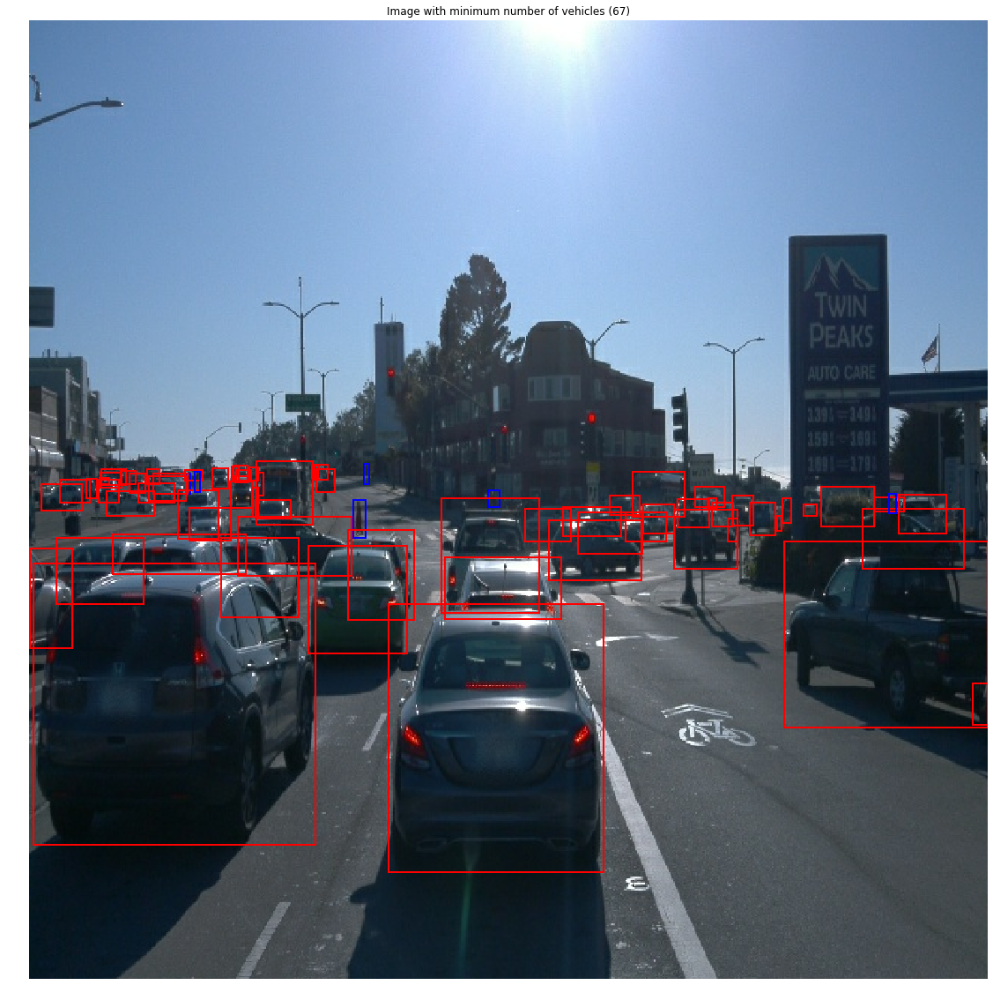

In [44]:
display_image(max_vehicle_batch, f'Image with maximum number of vehicles ({max_vehicle})')

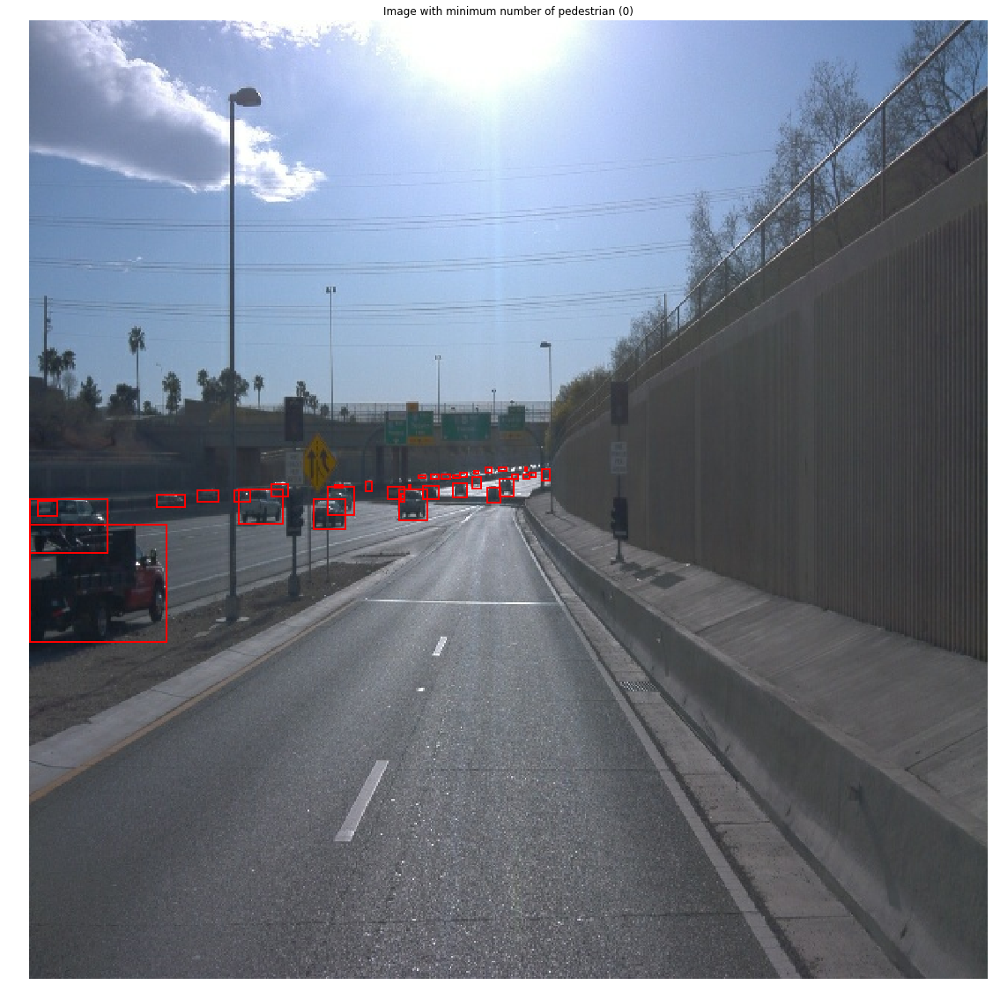

In [15]:
display_image(min_pedestrian_batch, f'Image with minimum number of pedestrian ({min_pedestrian})')

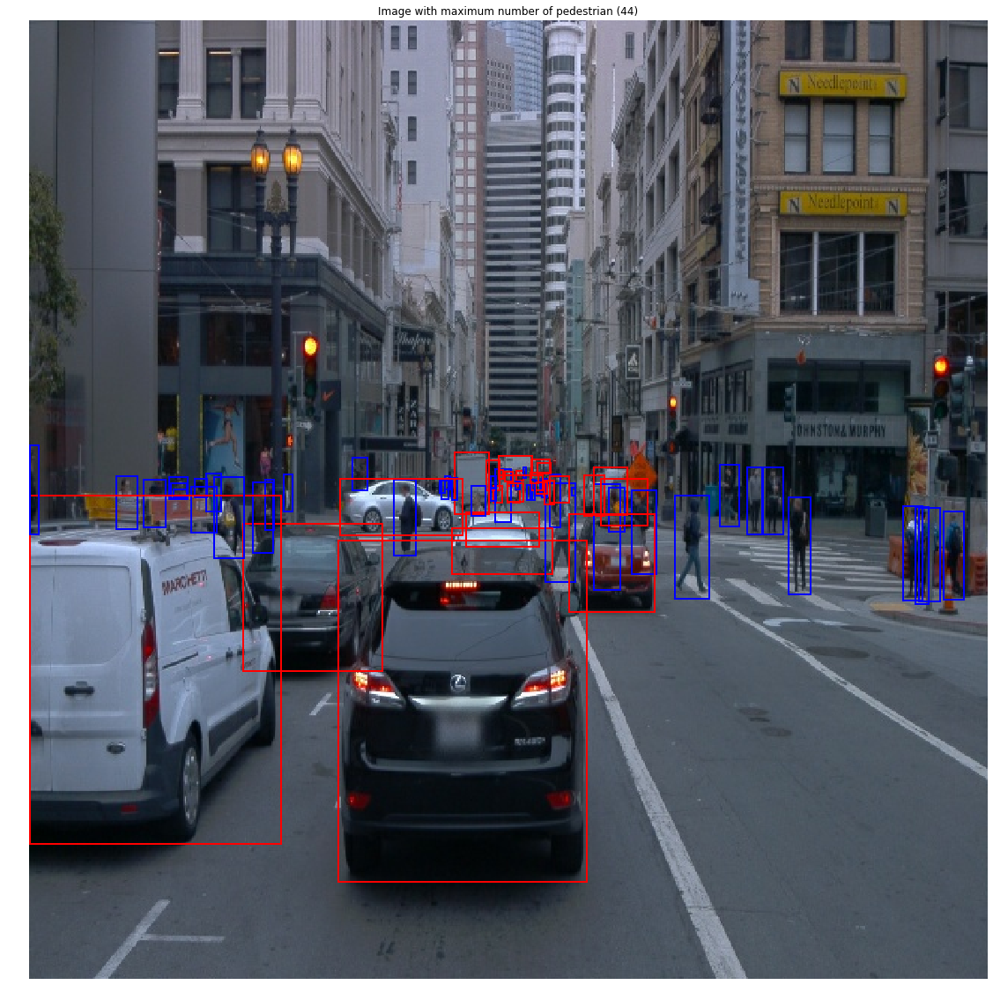

In [16]:
display_image(max_pedestrian_batch, f'Image with maximum number of pedestrian ({max_pedestrian})')

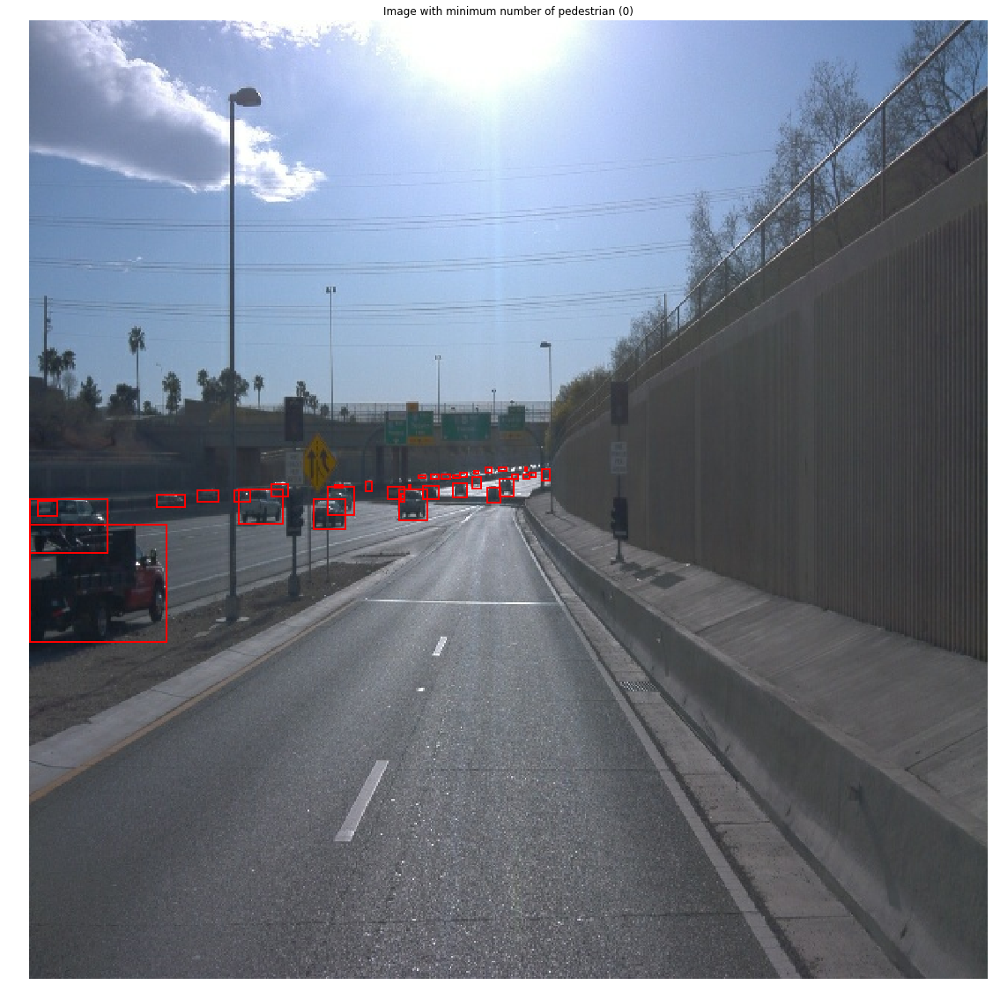

In [17]:
display_image(min_cyclist_batch, f'Image with minimum number of pedestrian ({min_cyclist})')

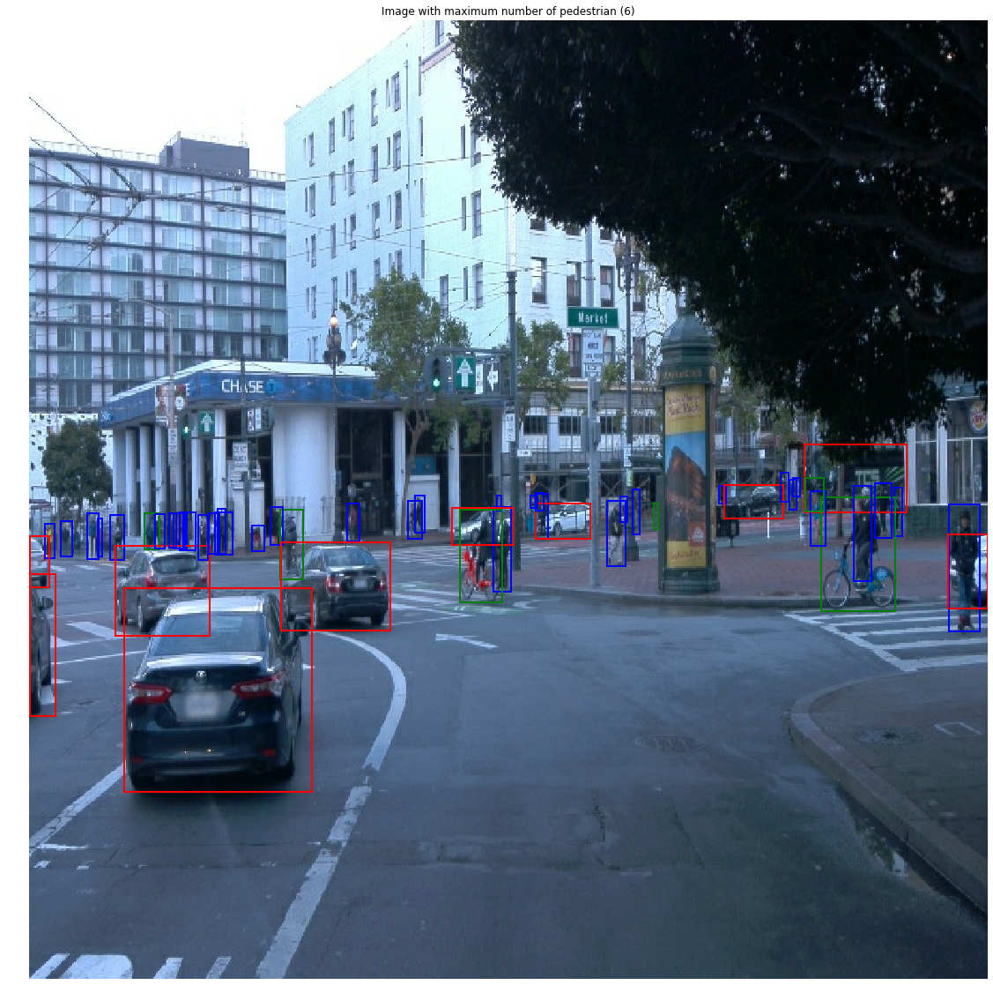

In [18]:
display_image(max_cyclist_batch, f'Image with maximum number of pedestrian ({max_cyclist})')

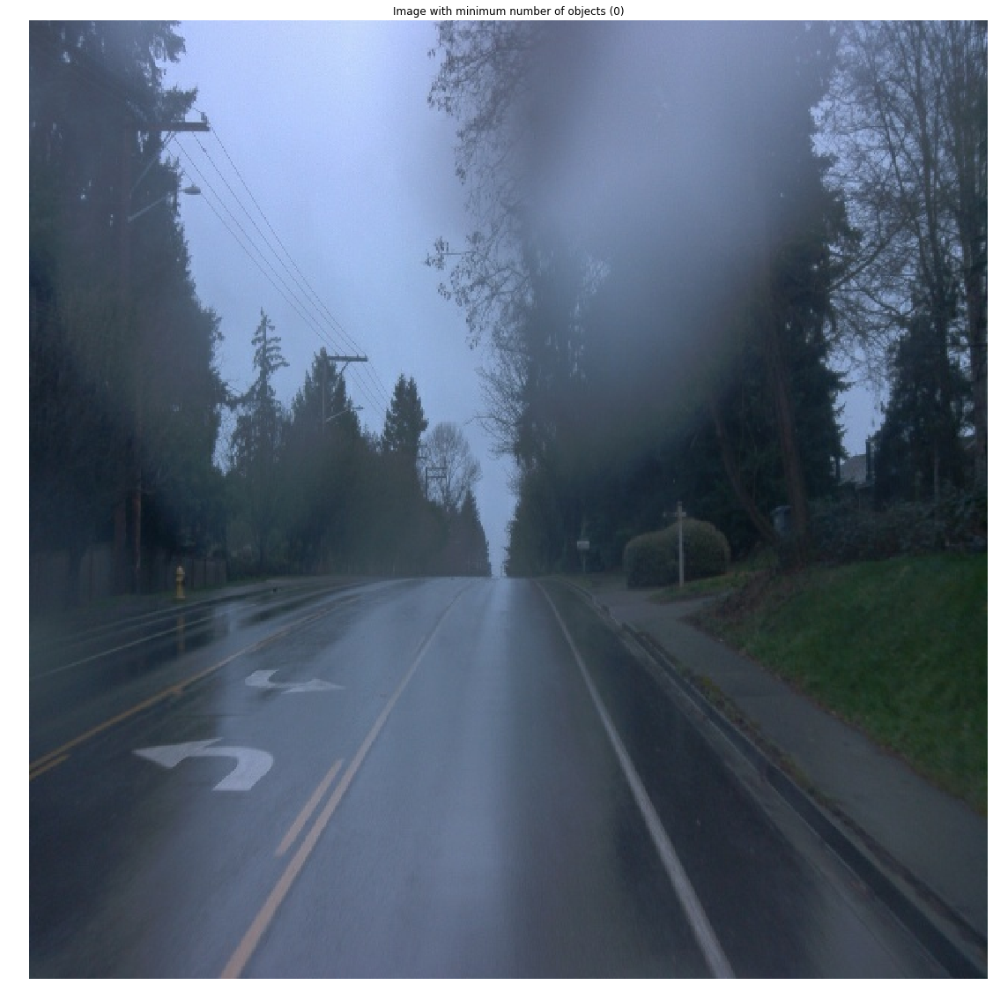

In [19]:
display_image(min_all_batch, f'Image with minimum number of objects ({min_all})')

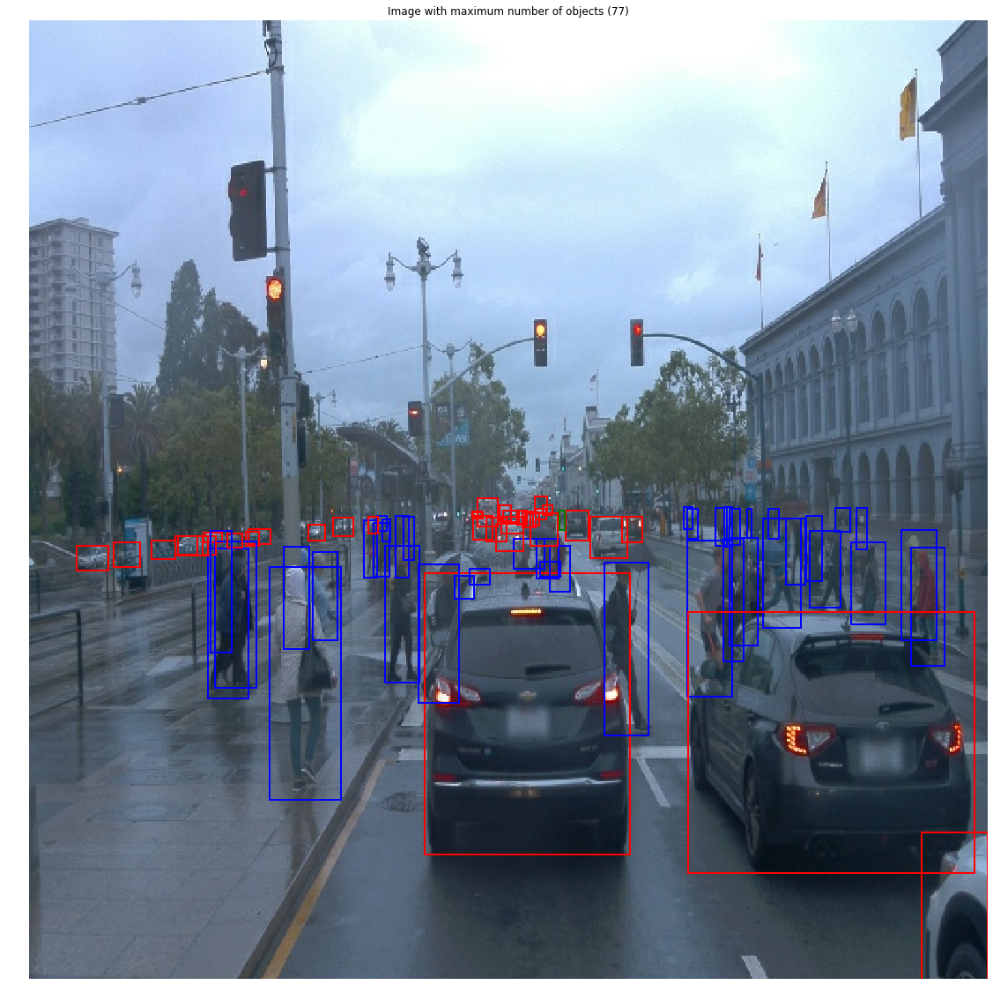

In [20]:
display_image(max_all_batch, f'Image with maximum number of objects ({max_all})')

### Conclusion
1. Our dataset is small. We only have **19803 batch** with **458997 labeled objects**.
2. Dataset is highly imbalanced. Especially, there are very few labeled cycists.
3. There are images with no labeled object (vehicle, pedestrian and cyclist).
4. There are no more than 67 vehicles, 44 pedestrian, 6 cyclists and 77 objects in each image.